<a href="https://colab.research.google.com/github/moralessP/Perception3D/blob/main/4_ColorRegistration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<Body>   
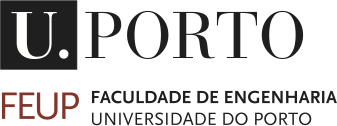   
<h1> <b>Perception and Mapping </b> </h1>
<p><b>Andry Maykol Pinto </b> (amgp@fe.up.pt)</p>
<p>Department of Electrical and Computer Engineering</p>
</Body>  
FEUP

---

Moraless Philius  -  202302762

# Project about "Visual Inspection of Offshore Structures"

The objective of this assignment is to develop a registration pipeline to process images and point clouds captured by a UAV, and subsequently, generate a textured and denser representation of an offshore structure. Unmanned Aerial Vehicles have become valuable tools for acquiring high-resolution aerial imagery and point clouds, making them ideal for surveying offshore structures such as oil platforms, wind turbines, or coastal infrastructure.

You will face several challenges in this assignment:

1. Data Integration: you will work with a combination of images and point clouds. Integrating these diverse data sources into a unified pipeline can be complex.

2. Point Cloud Texturization: one of the primary objectives is to apply texturing to the point cloud, giving it a realistic appearance. This involves mapping images onto the 3D structure, requiring careful alignment and blending of 2D images onto 3D surfaces (blending techniques are out of scope for Perception and Mapping course).

3. Point Cloud Registration: to create a denser representation, you need to register multiple individual point clouds into a cohesive and complete 3D model. This involves aligning and merging point clouds from different viewpoints.


## Description of the dataset

This assignment use data collected by an Unmanned Aerial Vehicle (UAV) during the inspection routines of a offshore structure in the [ATLANTIS Test Centre](https://www.linkedin.com/company/68810369/). The data retrieved by the UAV includes:

* **Visual information**: obtained by a 640x480 resolution camera. The lens distortion ($D_v$) and intrinsic matrix ($K_v$) are:

* **Thermographic information**: obtained by a 640x512 resolution camera. The lens distortion ($D_t$) and intrinsic matrix ($K_t$) are the following:

* **LiDAR**: is the ouster [OS1-64](https://ouster.com/products/hardware/os1-lidar-sensor) which has 64 channels with a maximum range of 200 metres, a vertical FOV of 45° (± 22.5°) and a precision of ± 0.5 to 3 cm.


The camera frame is the pivotal coordinate system for this dataset which means, the LiDAR and the Thermographic camera have individual frames in relation to the visual frame. The intrinsic and extrinsic calibration data for each sensor is:

> `Dv: [-0.21292081375160646, 0.1767752984756973, 0.00016650108739115778, -7.265397248140523e-05, -0.05302482500821179]`

> `Kv: [791.177953960177, 0.0, 339.436073232339, 0.0, 791.2141134510654, 257.30517663940424, 0.0, 0.0, 1.0]`

> `Dt: [-0.504042, 0.26894, 0.003454, -0.000748, 0.0]`

>`Kt: [767.942728, 0.0, 317.244746, 0.0, 767.068789, 231.644928, 0.0, 0.0, 1.0]`


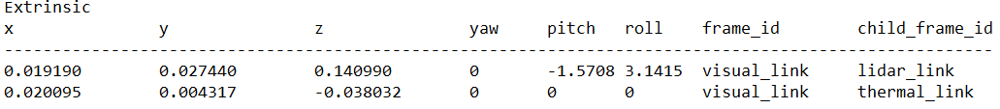

### Sincronization of data

The visual, thermal and point clouds data is timestamped to guarantee the synchronization of sensors. In the real world, there is no exact sincronization (without resorting to hardware sincronization techniques) however, it is possible to select the visual, LiDAR and thermal data with closer timming. This timestamp is encoded directly in the filename of each JPEG or PCD file from the dataset.

* Visual images are named as “image_1693472857**485**557608”
* Point cloud (pcd files) are named as “pointcloud_1693472857**508**994”
* Thermal images are named as “image_1693472857**498**990366



> **This project is focused only on Visual and LiDAR data.**

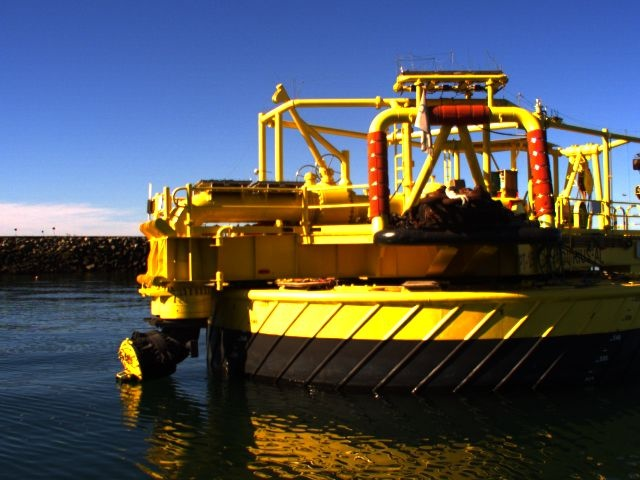

Figure 1 - Visual Images collected by UAV.

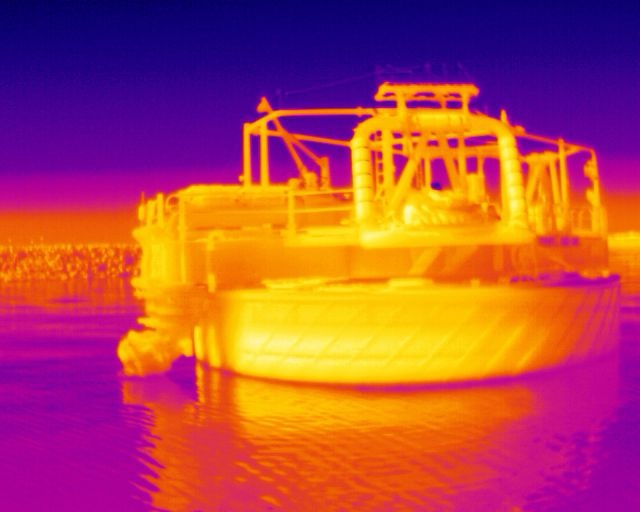

Figure 2 - Thermographic Images collected by UAV.

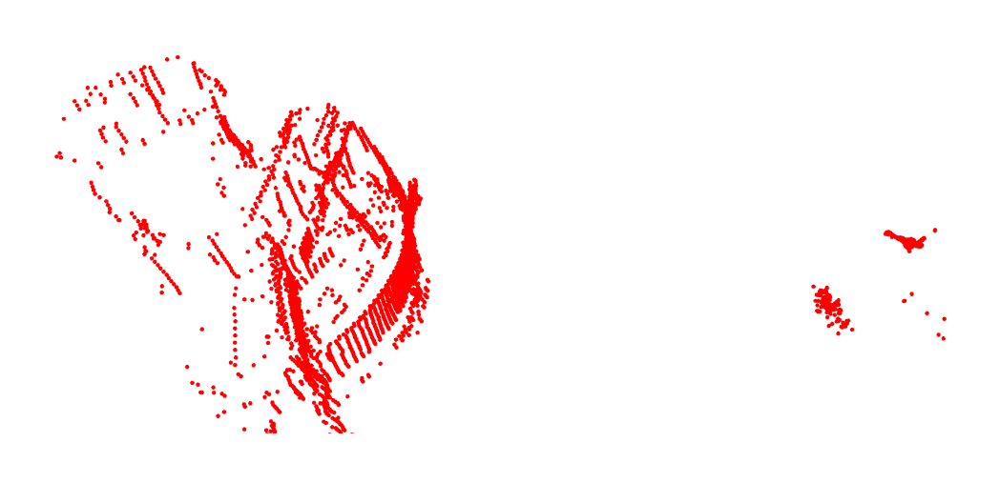

Figure 3 - Point cloud collected by UAV.

## Prepare Libraries and Download dataset

In [1]:
# Install Open3D library
!pip install open3d

In [2]:
# Import libraries
import numpy as np
import open3d as o3d
import copy

# Visualization
import plotly.graph_objects as go  # plotly to visualize since COLAB does not allow to use O3D functions
import matplotlib.pyplot as plt    # or, Matplotlib
from mpl_toolkits import mplot3d

In [3]:
# Visualize point cloud as a scatter plot using matplotlib (as an image!)
def plot_pointcloud_matplotlib_singleview (pt, title_ = ' ', view_ =(-90, 90, 0)):
  colors = None
  if pt.has_colors():
      colors = np.asarray(pt.colors)
  elif pt.has_normals():
      colors = (0.5, 0.5, 0.5) + np.asarray(pt.normals) * 0.5
  else:
      pt.paint_uniform_color((1.0, 0.0, 0.0))
      colors = np.asarray(pt.colors)

  points = np.asarray(pt.points)
  # Single View
  ax = plt.axes(projection='3d')
  ax.view_init(view_[0], view_[1], view_[2])
  ax.axis("on")
  ax.scatter(points[:,0], points[:,1], points[:,2], c=colors)
  ax.set_xlabel('X axis')
  ax.set_ylabel('Y axis')
  ax.set_zlabel('Z axis')

  plt.title(title_)
  plt.show()

#Plotly
def draw_geometries(geometries):
    graph_objects = []

    for geometry in geometries:
        geometry_type = geometry.get_geometry_type()

        if geometry_type == o3d.geometry.Geometry.Type.PointCloud:
            points = np.asarray(geometry.points)
            colors = None
            if geometry.has_colors():
                colors = np.asarray(geometry.colors)
            elif geometry.has_normals():
                colors = (0.5, 0.5, 0.5) + np.asarray(geometry.normals) * 0.5
                geometry.colors = o3d.utility.Vector3dVector(colors)
            else:
                geometry.paint_uniform_color((1.0, 0.0, 0.0))
                colors = np.asarray(geometry.colors)

            scatter_3d = go.Scatter3d(x=points[:,0], y=points[:,1], z=points[:,2], mode='markers', marker=dict(size=2, color=colors))
            graph_objects.append(scatter_3d)

        if geometry_type == o3d.geometry.Geometry.Type.TriangleMesh:
            triangles = np.asarray(geometry.triangles)
            vertices = np.asarray(geometry.vertices)
            colors = None
            if geometry.has_triangle_normals():
                colors = (0.5, 0.5, 0.5) + np.asarray(geometry.triangle_normals) * 0.5
                colors = tuple(map(tuple, colors))
            else:
                colors = (1.0, 0.0, 0.0)

            mesh_3d = go.Mesh3d(x=vertices[:,0], y=vertices[:,1], z=vertices[:,2], i=triangles[:,0], j=triangles[:,1], k=triangles[:,2], facecolor=colors, opacity=0.50)
            graph_objects.append(mesh_3d)

        if geometry_type == o3d.geometry.Geometry.Type.VoxelGrid:
            bounds     = geometry.get_max_bound()-geometry.get_min_bound()

            voxels     = geometry.get_voxels()   # Returns List of Voxel
            vox_mesh   = o3d.geometry.TriangleMesh()

            for v in voxels:
                cube = o3d.geometry.TriangleMesh.create_box(width=1, height=1, depth=1)
                cube.paint_uniform_color(v.color)
                cube.translate(v.grid_index, relative=False)
                vox_mesh += cube

            vox_mesh.translate([0.5,0.5,0.5], relative=True)

            vox_mesh.merge_close_vertices(0.0000001)
            # T=np.array([[1, 0, 0, 0],[0, 0, 1, 0],[0, -1, 0, 0],[0, 0, 0, 1]])
            vox_mesh.translate(geometry.origin, relative=True)

            # Now is like a TriangleMesh
            triangles = np.asarray(vox_mesh.triangles)
            vertices = np.asarray(vox_mesh.vertices)
            colors = None
            if vox_mesh.has_triangle_normals():
                colors = (0.5, 0.5, 0.5) + np.asarray(vox_mesh.triangle_normals) * 0.5
                colors = tuple(map(tuple, colors))
            else:
                vox_mesh.compute_vertex_normals()
                colors = (0.5, 0.5, 0.5) + np.asarray(vox_mesh.triangle_normals) * 0.5
                colors = tuple(map(tuple, colors))                                        # or colors = (0, 0, 0)

            mesh_3d = go.Mesh3d(x=vertices[:,0], y=vertices[:,1], z=vertices[:,2], i=triangles[:,0], j=triangles[:,1], k=triangles[:,2], facecolor=colors, opacity=0.50)
            graph_objects.append(mesh_3d)

    fig = go.Figure(
        data=graph_objects,
        layout=dict(
            scene=dict(
                xaxis=dict(visible=False),
                yaxis=dict(visible=False),
                zaxis=dict(visible=False)
            )
        )
    )
    fig.show()

In [4]:
o3d.visualization.draw_geometries = draw_geometries # replacing the function of Open3D

In [5]:
# Download
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1gYZkDqykhvMwl_xTOr0Ln_P39BfuMf4G' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1gYZkDqykhvMwl_xTOr0Ln_P39BfuMf4G" -O DURIUS_d1.zip && rm -rf /tmp/cookies.txt

--2023-12-22 17:17:49--  https://docs.google.com/uc?export=download&confirm=t&id=1gYZkDqykhvMwl_xTOr0Ln_P39BfuMf4G
Resolving docs.google.com (docs.google.com)... 173.194.195.113, 173.194.195.138, 173.194.195.102, ...
Connecting to docs.google.com (docs.google.com)|173.194.195.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-10-20-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/92erht8kljovtvn8dqc0f3lh3eog6bmm/1703265450000/13534716541280397350/*/1gYZkDqykhvMwl_xTOr0Ln_P39BfuMf4G?e=download&uuid=50af09d9-564d-49df-bc34-f49dc639fd9f [following]
--2023-12-22 17:17:49--  https://doc-10-20-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/92erht8kljovtvn8dqc0f3lh3eog6bmm/1703265450000/13534716541280397350/*/1gYZkDqykhvMwl_xTOr0Ln_P39BfuMf4G?e=download&uuid=50af09d9-564d-49df-bc34-f49dc639fd9f
Resolving doc-10-20-docs.googleusercontent.com (doc-10-20-docs.googleusercontent.com)... 64.233.183.1

In [6]:
# Extract point clouds from ZIP file.
import zipfile
import os

with zipfile.ZipFile("DURIUS_d1.zip", mode="r") as archive:
  for file in archive.namelist():
    archive.extract(file, "dataset_uav/")

# Part 1 - Point Cloud Texturization
Point clouds provide a powerful representation of 3D environments, capturing the spatial structure of objects and scenes with precision. However, raw point clouds lack visual realism as they consist of untextured geometric points. The challenge in this problem is to develop a point cloud texturization process that enhances the visual quality of point cloud data by mapping 2D textures onto 3D surfaces.

>**Problem Overview:**

>Design a function that receives the point cloud and the image, and uses the extrinsic and intrinsic calibration data to obtain the texture information that will be used to colorize the point cloud acquired by the LiDAR.

> **Expected output:** a point cloud with RGB colors in each point. This RGB color must be obtained using the visual data.



## Loading Images and Point Clouds

Start by selecting a point cloud and a image with similar timestamps.

In [7]:
DIR_PCL = "dataset_uav/data_1/PCD/"
DIR_RGB = "dataset_uav/data_1/RGB/"
DIR_THE = "dataset_uav/data_1/Thermal/"

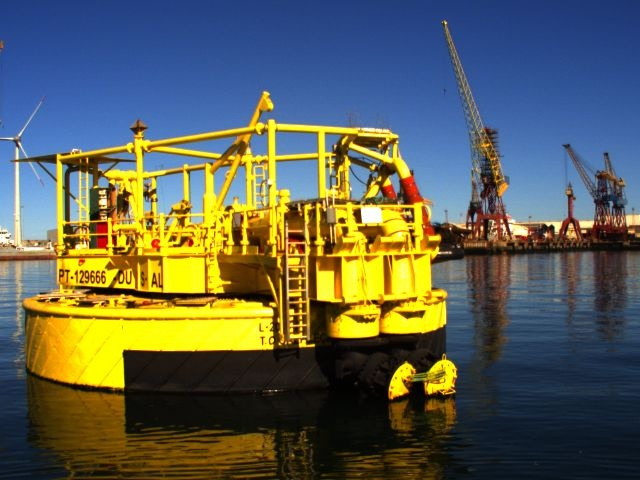

In [8]:
"""
 this example: data is loaded individually. For loading many files --> glob library
"""

import cv2
from google.colab.patches import cv2_imshow
image = cv2.imread(DIR_RGB+"image_1693472866120269331.jpg")
cv2_imshow(image)

# Load a PCD file as a point cloud
pt_example = o3d.io.read_point_cloud(DIR_PCL+"pointcloud_1693472866008728.pcd", format='pcd')
if pt_example.is_empty():
  exit()


In [9]:
o3d.visualization.draw_geometries([pt_example])

### 1.1 Pre-processing the point cloud
Apply some pre-processing techniques to improve the quality of the 3D Data.


In [10]:
x_range = [4.33, 29.90]
y_range = [-4.67, 3.26]
z_range = [-10.23, 2.80]

roi = o3d.geometry.AxisAlignedBoundingBox(min_bound=[x_range[0], y_range[0], z_range[0]],
                                          max_bound=[x_range[1], y_range[1], z_range[1]])
pt_cloud = pt_example.crop(roi)

In [11]:
o3d.visualization.draw_geometries([pt_cloud])

In this first step, I focused my efforts on data preprocessing. My goal was to maximize the efficiency of the subsequent processing by keeping only the relevant points of interest. To do this, I used an approach based on a range of values, although this method may seem empirical, it proved to be effective for accurately selecting the relevant points. This trial and error process resulted in a wise selection of points, thus creating a solid foundation for the next steps of the project.

### 1.2 Define the Intrinsic and Extrinsic matrices, and transform the data for different coordinates

Use the Open3D objects/methods to modify the coordinate system of the point cloud.

In [12]:
def extrinsic_matrix(x, y, z, yaw, pitch, roll):

  Rx = np.array([[1, 0, 0],
                  [0, np.cos(roll), -np.sin(roll)],
                  [0, np.sin(roll), np.cos(roll)]])

  Ry = np.array([[np.cos(pitch), 0, np.sin(pitch)],
                [0, 1, 0],
                [-np.sin(pitch), 0, np.cos(pitch)]])

  Rz = np.array([[np.cos(yaw), -np.sin(yaw), 0],
                [np.sin(yaw), np.cos(yaw), 0],
                [0, 0, 1]])
  R = Ry @ Rx @ Rz
  t = np.array([x, y, z])

  T = np.eye(4)
  T[:3, :3] = R
  T[:3, 3] = t

  return T

In [13]:
# Intrinsic visual matrix
Kv = np.array([[791.17795,   0.0,      339.43607,],
               [  0.0,      791.2141,  257.3051  ],
               [  0.0,        0.0,        1.0    ]])

# Intrinsic thermographic matrix
Kt = np.array([[767.9427,   0.0,     317.2447],
               [  0.0,     767.0687, 231.6449],
               [  0.0,       0.0,       1.0  ]])

# Extrinsic visual matrix
Ev = extrinsic_matrix(x=0.019190, y=0.027440, z=0.140990, yaw=0, pitch=-1.5708, roll=3.1415)

# Extrinsic thermographic matrix
Et = extrinsic_matrix(x=0.020095, y=0.004317, z=-0.038032, yaw=0, pitch=0, roll=0)

# Distorsion visual
Dv = np.array([-0.212920, 0.176775, 0.000166, -7.2e-05, -0.053024])

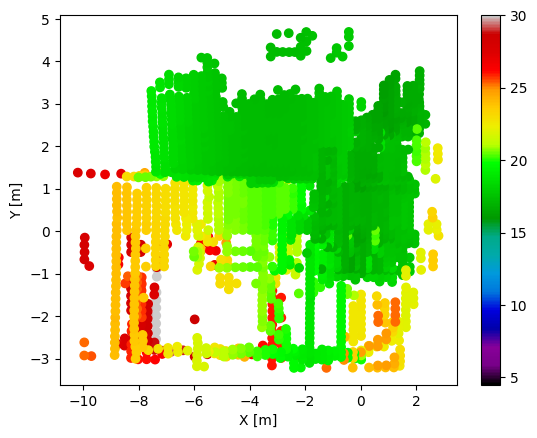

In [14]:
# Undistort
image = cv2.undistort(image, Kv, Dv)

# Transform
pt_cloud.transform(Ev)
points = np.asarray(pt_cloud.points)

pt_cloud.points = o3d.utility.Vector3dVector(points)
#o3d.visualization.draw_geometries([pt_cloud])

# plot
fig, ax = plt.subplots()
sc = ax.scatter(points[:,0], points[:,1], c=points[:,2], cmap="nipy_spectral")
plt.xlabel("X [m]")
plt.ylabel("Y [m]")
plt.colorbar(sc)
plt.show()

The definition of the intrinsic and extrinsic matrices marked the beginning of the conversion of raw data into actionable information. The intrinsic matrices were carefully defined to reflect the specific properties of the camera used, taking into account parameters such as focal length and optical center. The extrinsic matrices were determined for each camera viewpoint, thus capturing the position and orientation of the camera in 3D space. This allowed each point cloud to be associated with its actual position in the world, thus laying the foundation for accurate visualization.

By applying these transformations on the point clouds, I was able to align the data consistently with the real world, thus creating a faithful representation of the captured environment.

### 1.3 Convert 3D Points to Image Plane, and show each 2D point in the RGB image

In [15]:
# Project 3D points to 2D image plane using virtual camera intrinsic matrix
depth_map_pt = (Kv @ points.T).T

# Normalize by the third coordinate
depth_map_pt = depth_map_pt / depth_map_pt[:, 2:3]

depth_map_pt[:, :2] = np.round(depth_map_pt[:, :2])
depth_map_pt = np.array([point for point in depth_map_pt if point[0] <= image.shape[0] and point[1] <= image.shape[1]])
print(depth_map_pt)

[[448. 375.   1.]
 [448. 385.   1.]
 [437. 254.   1.]
 ...
 [ 27. 384.   1.]
 [ 26. 389.   1.]
 [ 26. 394.   1.]]


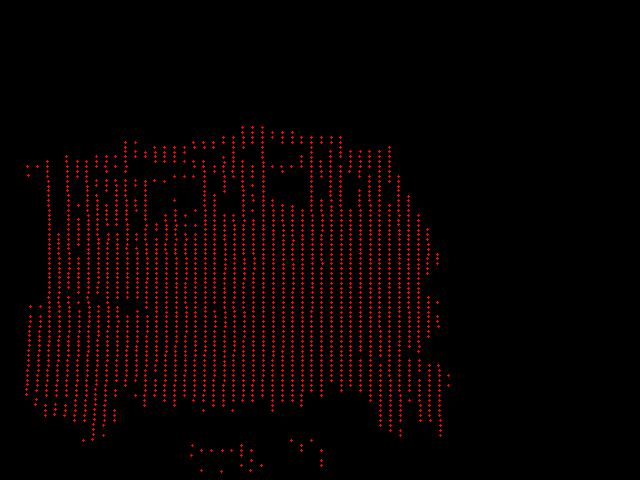

In [16]:
# Show the 3D -> 2D image projection
pp_3D_2D_projection = np.array(depth_map_pt)
#print(pp_3D_2D_projection)
pp_3D_2D_projection[:, 2] = points[1:, 2] #TODO à generaliser
pt_image_projection        = o3d.geometry.PointCloud()
pt_image_projection.points = o3d.utility.Vector3dVector(pp_3D_2D_projection)
o3d.visualization.draw_geometries([pt_image_projection])

# Show the 3D -> 2D projection using OpenCV
range_map_color = np.zeros_like(image)
for point in depth_map_pt:
    x, y = int(point[0]), int(point[1])
    cv2.circle(range_map_color, (x, y), 1, (0, 0, 255), -1)

cv2_imshow(range_map_color)

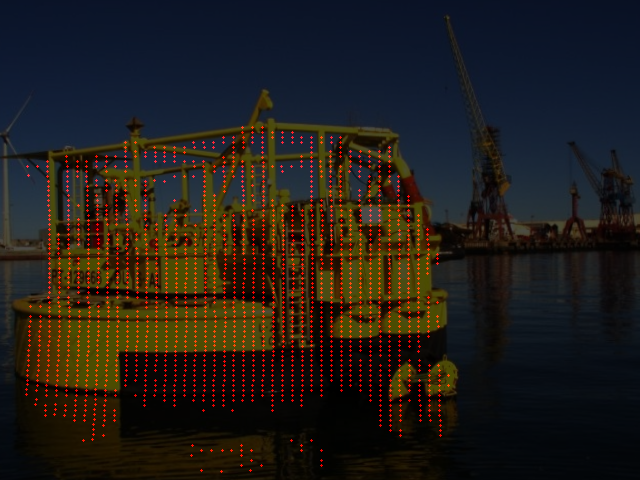

In [17]:
#Overlaying
image_show = image.copy()
image_projection_color = image_show*0.3 + range_map_color*0.9
cv2_imshow(image_projection_color)

After aligning the point clouds with the real world, the next step was to project these points into the 2D image plane in order to merge them with the color information from the RGB images. This transition was done using the intrinsic matrix, denoted here as Kv

The resulting 2D coordinates were rounded and converted to integers to fit the pixel indexing in the image. This process laid the groundwork for assigning colors to the point clouds, thus facilitating the creation of a rich and accurate visual representation of the captured environment.

### 1.4 Colorize the Point cloud of the DURIUS taking into consideration the RGB data from the Image

In [18]:
RBG_pt = image[depth_map_pt[:, 1].astype(int), depth_map_pt[:, 0].astype(int)][:, ::-1] / 255.0
print(RBG_pt)

[[0.98431373 0.93333333 0.03137255]
 [0.98431373 0.98823529 0.00784314]
 [0.65490196 0.51764706 0.10196078]
 ...
 [0.2        0.16862745 0.05490196]
 [0.20784314 0.15294118 0.00784314]
 [0.21960784 0.16470588 0.03137255]]


In [19]:
#Show results
pt_image_projection.colors = o3d.utility.Vector3dVector(RBG_pt)
o3d.visualization.draw_geometries([pt_image_projection])

The coloring of the point cloud was a crucial step to create a realistic and faithful visual representation of the captured environment. Despite some minor flaws, the final result is overall satisfactory. Each point of the point cloud was accurately assigned to the corresponding color extracted from the associated RGB image.

### 1.5 Save the final point cloud with texture

In [20]:
o3d.io.write_point_cloud(DIR_PCL+"pointcloud_texture.pcd", pt_image_projection)

True

In [21]:
# Load a PCD file as a point cloud
pt_cloud_texture = o3d.io.read_point_cloud(DIR_PCL+"pointcloud_texture.pcd")
o3d.visualization.draw_geometries([pt_cloud_texture])

### 1.7 The complete algorithm to colorize point cloud

In [22]:
def colorize_point_cloud(point_cloud_filename, image_filename, index):

    image = cv2.imread(DIR_RGB+image_filename)
    pt_cloud = o3d.io.read_point_cloud(DIR_PCL+point_cloud_filename, format='pcd')
    if pt_cloud.is_empty():
      exit()

    image = cv2.undistort(image, Kv, Dv)
    # Preprocessing
    x_range = [4.33, 29.90]
    y_range = [-4.67, 3.26]
    z_range = [-12, 4]
    roi = o3d.geometry.AxisAlignedBoundingBox(min_bound=[x_range[0], y_range[0], z_range[0]],
                                              max_bound=[x_range[1], y_range[1], z_range[1]])

    # Crop and transform the point cloud
    cropped_point_cloud = pt_cloud.crop(roi)
    cropped_point_cloud.transform(Ev)

    # Convert to numpy array
    points = np.asarray(cropped_point_cloud.points)

    # Project 3D points to 2D
    depth_map_pt = (Kv @ points.T).T
    depth_map_pt = depth_map_pt / depth_map_pt[:, 2:3]
    depth_map_pt[:, :2] = np.round(depth_map_pt[:, :2])
    depth_map_pt = depth_map_pt.astype(int)
    depth_map_pt = np.array([point for point in depth_map_pt if 0 <= point[0] < image.shape[1] and 0 <= point[1] < image.shape[0]])

    # Colorized point cloud
    temp = min(len(depth_map_pt[:, :2]), len(points[:, 2:]))
    pp_3D_2D_projection = np.hstack([depth_map_pt[:, :2], points[len(points[:, 2:]) - temp:, 2:]])
    pt_image_projection = o3d.geometry.PointCloud()
    pt_image_projection.points = o3d.utility.Vector3dVector(pp_3D_2D_projection)

    #######
    range_map_color = np.zeros_like(image)
    for point in depth_map_pt:
      x, y = int(point[0]), int(point[1])
      cv2.circle(range_map_color, (x, y), 1, (0, 0, 255), -1)
    image_show = image.copy()
    image_projection_color = image_show*0.3 + range_map_color*0.9
    cv2_imshow(image_projection_color)
    #######

    RGB_pt = image[depth_map_pt[:, 1], depth_map_pt[:, 0]][:, ::-1] / 255.0
    pt_image_projection.colors = o3d.utility.Vector3dVector(RGB_pt)

    # Save the point cloud with texture
    o3d.io.write_point_cloud(DIR_PCL+"pointcloud_texture"+str(index)+".pcd", pt_image_projection)


-----------------------------

# Part 2 - Developing a 3D Registration Pipeline

The challenge in this problem is to design and implement a colorized registration pipeline that aligns multiple point clouds with associated color information to create a unified, high-fidelity 3D model.



>**Problem Overview:**

> Develop a colorized point cloud registration system that takes multiple input point clouds, each with associated color data, and aligns them into a single, coherent 3D model. The goal is to preserve both the geometric accuracy and color consistency across the merged point clouds, enhancing the visual realism and information content.

> **Expected output:** an unified point cloud with RGB colors representing the DURIUS infrastructure.

* **50% of penalization:** if *> 75% of all point clouds available* in the dataset are used to create the unified point cloud.

* **25% of penalization:** if *> 25% of all point clouds available* in the dataset are used to create the unified point cloud.

* **0% of penalization:** for implemementations that produce an unified point cloud using *only 12 point clouds retrieved uniformly from all dataset*.





## 2.1 Prepare the dataset that will be used for the registration

a) Select the raw point clouds and images that will be used for the registration process.

b) Load and colorize the point clouds using the function designed in Part1 of this assignment.

c) Save each point cloud (with texture). Show explicitly the number of point clouds that have been processed.

In [23]:
import re

def extract_timestamp_parts(filename):
    match = re.search(r'(\d{10})(\d{3})', filename)
    return tuple(map(int, match.groups())) if match else (None, None)

def find_closest_files(pcd_files, rgb_files):
    pcd_timestamps = [(extract_timestamp_parts(f), f) for f in pcd_files]
    rgb_timestamps = [(extract_timestamp_parts(f), f) for f in rgb_files]

    corresponding_files = []

    for pcd_ts, pcd_file in pcd_timestamps:
        if None in pcd_ts:
            continue

        matching_rgb = [(rgb_ts, rgb_file) for rgb_ts, rgb_file in rgb_timestamps if rgb_ts[0] == pcd_ts[0]]

        if not matching_rgb:
            continue

        closest_rgb = min(matching_rgb, key=lambda x: abs(x[0][1] - pcd_ts[1]))
        corresponding_files.append((pcd_file, closest_rgb[1]))

    return corresponding_files

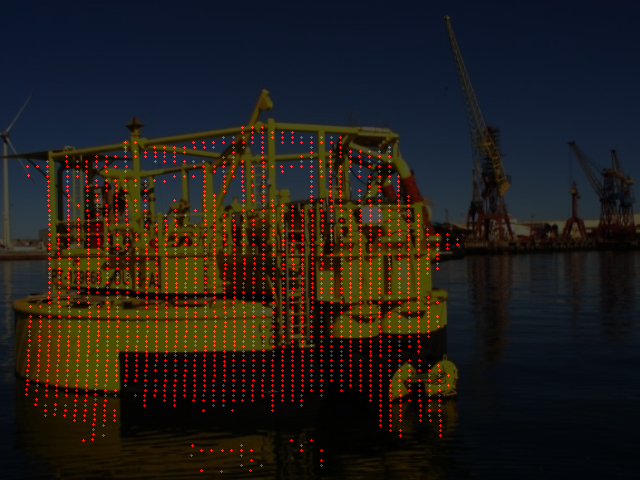

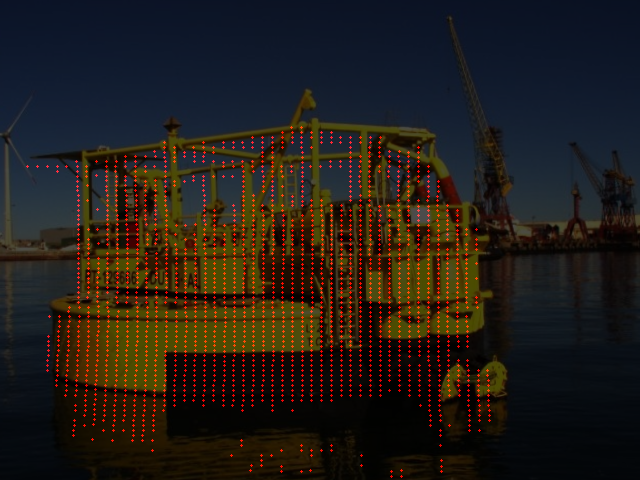

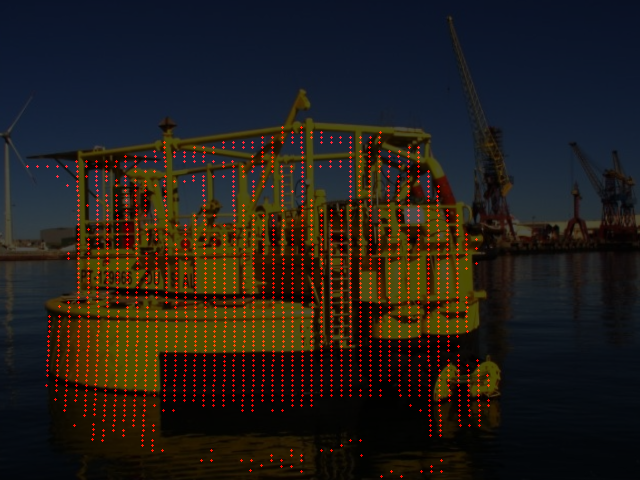

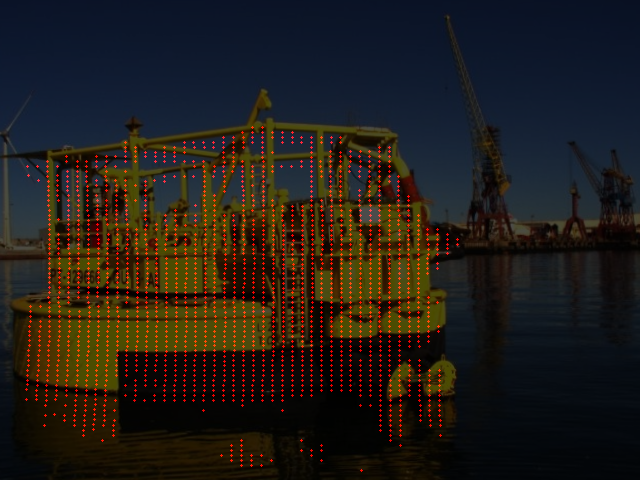

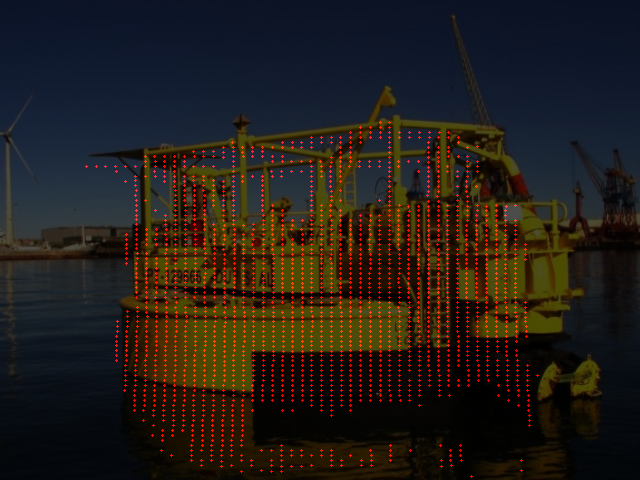

...

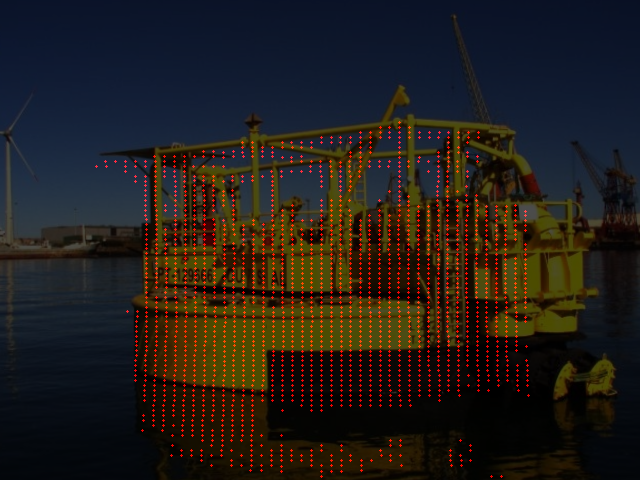

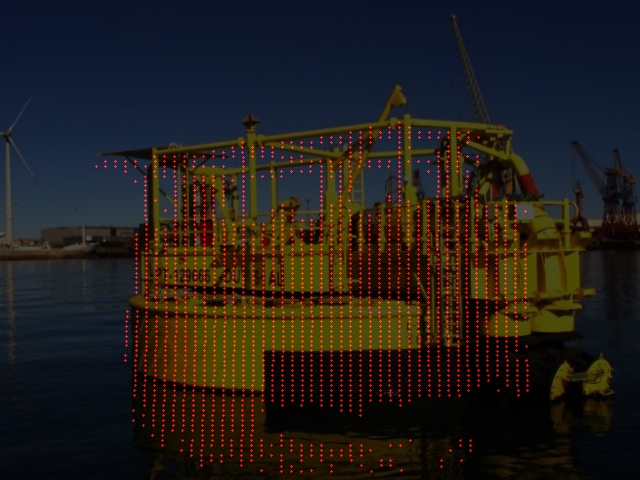

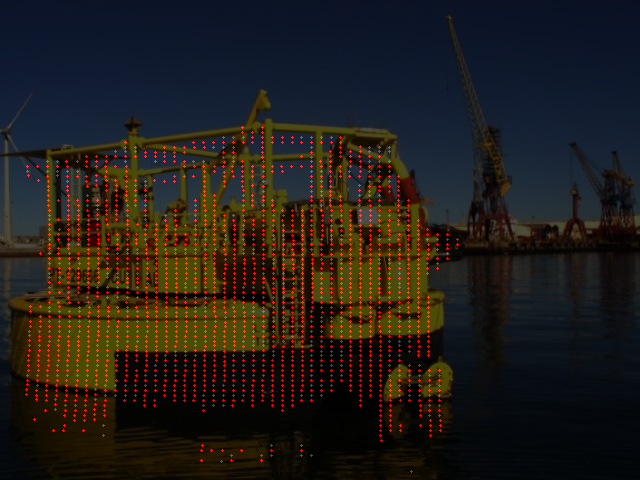

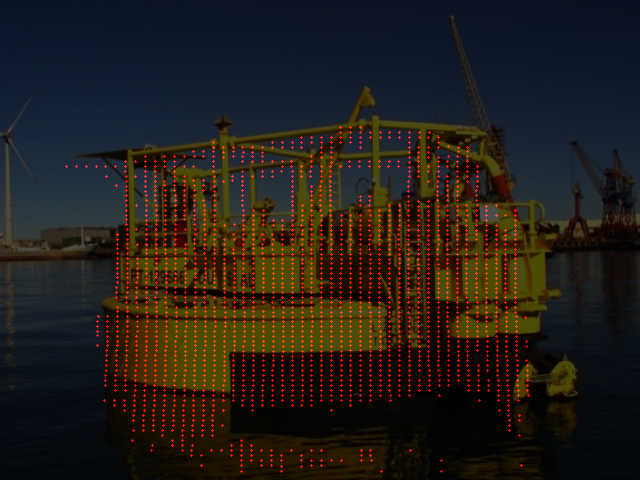

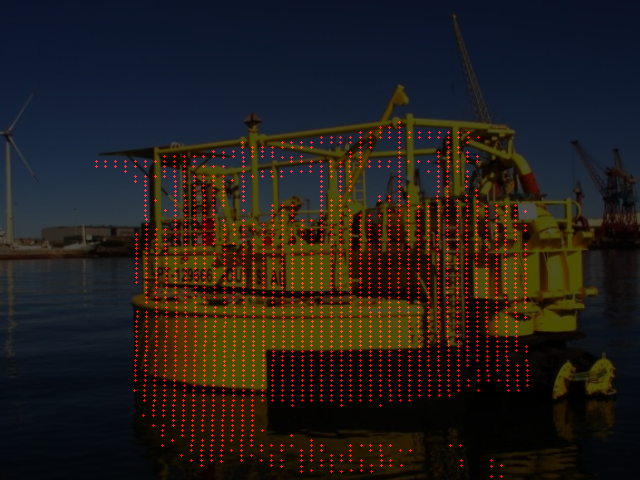

In [24]:
pcd_files = [file for file in os.listdir(DIR_PCL)]
rgb_files = [file for file in os.listdir(DIR_RGB)]

pcd_rgb_files = find_closest_files(pcd_files, rgb_files)
for i in range(0, 100, 9):
  pcd_filename, rgb_filename = pcd_rgb_files[i]
  colorize_point_cloud(pcd_filename, rgb_filename, ((i)//9) + 1)

#print(pcd_rgb_files)

In order to obtain a complete and accurate representation of the DURIUS, a registration pipeline approach was implemented. Due to the camera movement, it was decided to select pairs of point clouds and associated images with a delay of 9 timestamps to capture as many points as possible.

A total of 12 data sets were constituted to ensure a complete and detailed representation of the DURIUS robot in its environment. Each point cloud was colored using the information from the corresponding RGB image, thus adding essential visual details to the captured scene.

In [25]:
pt_clouds = []
for i in range (1, 13):
  pt_clouds.append(o3d.io.read_point_cloud(DIR_PCL+"pointcloud_texture"+str(i)+".pcd"))

o3d.visualization.draw_geometries([pt_clouds[0]])

## 2.2 Estimate a transformation matrix for each point cloud

In [26]:
def colored_icp_registration(source, target, voxel_size=1):
    print("Colored ICP registration")
    voxel_radius = [10*voxel_size, 5*voxel_size, 2*voxel_size]
    max_iter = [100, 75, 50]
    current_transformation = np.identity(4)
    evaluation = o3d.pipelines.registration.evaluate_registration(source, target, 0.05 , current_transformation)
    print('initial guess:::', evaluation)
    for scale in range(3):
        max_it = max_iter[scale]
        radius = voxel_radius[scale]
        source_down = source.voxel_down_sample(radius)
        target_down = target.voxel_down_sample(radius)
        source_down.estimate_normals(o3d.geometry.KDTreeSearchParamHybrid(radius=2*radius, max_nn=20))
        target_down.estimate_normals(o3d.geometry.KDTreeSearchParamHybrid(radius=2*radius, max_nn=20))
        result = o3d.pipelines.registration.registration_colored_icp(
            source_down,
            target_down,
            radius,
            current_transformation,
            o3d.pipelines.registration.TransformationEstimationForColoredICP(),
            o3d.pipelines.registration.ICPConvergenceCriteria(relative_fitness=1e-6,
                                                              relative_rmse=1e-6,
                                                              max_iteration=max_it))
        current_transformation = result.transformation

    evaluation = o3d.pipelines.registration.evaluate_registration(source, target, 0.05 , current_transformation)
    print('after ICP :::', evaluation)
    return current_transformation

print(colored_icp_registration(pt_clouds[1], pt_clouds[0]))

Colored ICP registration
initial guess::: RegistrationResult with fitness=3.838863e-02, inlier_rmse=2.883621e-02, and correspondence_set size of 81
Access transformation to get result.
after ICP ::: RegistrationResult with fitness=0.000000e+00, inlier_rmse=0.000000e+00, and correspondence_set size of 0
Access transformation to get result.
[[ 9.99999879e-01 -4.69517101e-04 -1.46110811e-04 -3.88362456e+01]
 [ 4.69518042e-04  9.99999890e-01  6.40576342e-06  5.63525930e-01]
 [ 1.46107787e-04 -6.47436431e-06  9.99999989e-01  1.60430482e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


To estimate the transformations of each point cloud, I opted for the ICP algorithm, taking into account the color of the points for a smoother and more accurate representation. The first registered point cloud was chosen as the reference (target) for the transformation operations.

The use of ICP with color consideration allows for more precise transformations, taking into account the additional visual information from the associated RGB images. This approach ensures a better match between successive point clouds, thus contributing to a more consistent representation of the DURIUS.

In [27]:
registered_pointclouds = [pt_clouds[0]]
for i in range(1, len(pt_clouds)-1):
    transformation_matrix = colored_icp_registration(pt_clouds[i], pt_clouds[0])
    registered_pointclouds.append(pt_clouds[i].transform(transformation_matrix))

Colored ICP registration
initial guess::: RegistrationResult with fitness=3.838863e-02, inlier_rmse=2.883621e-02, and correspondence_set size of 81
Access transformation to get result.
after ICP ::: RegistrationResult with fitness=0.000000e+00, inlier_rmse=0.000000e+00, and correspondence_set size of 0
Access transformation to get result.
Colored ICP registration
initial guess::: RegistrationResult with fitness=4.293893e-02, inlier_rmse=2.779687e-02, and correspondence_set size of 90
Access transformation to get result.
after ICP ::: RegistrationResult with fitness=0.000000e+00, inlier_rmse=0.000000e+00, and correspondence_set size of 0
Access transformation to get result.
Colored ICP registration
initial guess::: RegistrationResult with fitness=8.002951e-01, inlier_rmse=2.084166e-02, and correspondence_set size of 1627
Access transformation to get result.
after ICP ::: RegistrationResult with fitness=0.000000e+00, inlier_rmse=0.000000e+00, and correspondence_set size of 0
Access trans

## 2.3 Concatenate the points of all point clouds, and create an unified point cloud.

In [28]:
pt_registered = o3d.geometry.PointCloud()
for transformed_point_cloud in registered_pointclouds:
    pt_registered += transformed_point_cloud

In [29]:
# Show the Registered Point Cloud
o3d.visualization.draw_geometries([pt_registered])

# Checking transformations manually
#draw_registration_result(pt_3, pt_4, transformations[2])

# Checking point clouds individually
#o3d.visualization.draw_geometries([registered_pointclouds[0], registered_pointclouds[1], registered_pointclouds[2], registered_pointclouds[3]])

The fusion of these point clouds resulted in a more complete and detailed representation of the DURIUS. The diversity of viewpoints helped to capture more details and structures, thus offering a more holistic vision.

### 2.4 Post-processing the registered point cloud

In [30]:
point_cloud_filtered = pt_registered.voxel_down_sample(voxel_size=0.01)
point_cloud_filtered, _ = point_cloud_filtered.remove_statistical_outlier(nb_neighbors=10, std_ratio=3.0)

o3d.visualization.draw_geometries([point_cloud_filtered])
print(f"PointClouds: {len(point_cloud_filtered.points)}")

PointClouds: 22274


This cleaning of the point cloud allowed to obtain a more aesthetic and accurate final representation of the robot, ready to be used in later applications such as 3D modeling or augmented reality.

### 2.5 Save the unified point cloud of DURIUS

In [31]:
o3d.io.write_point_cloud("unified_point_cloud.pcd", point_cloud_filtered)

True


It's DONE!

**Instructions for submitting this work:**
* This colab file must be executed before the delivery.

* The code must be ready to run without permissions for accessing shared folders.

* To avoid problems with the Plotly, please encode an image in this colab (from printscreen) for each core result that you have.

* Deliver also in the Moodle the unified point cloud.
--------------------------